# Feature Matching

국민대학교 차량지능기초 SLAM 파트 과제 2

- 학번 : 20161890
- 이름 : 고의석

---

OpenCV를 사용하여 feature description을 얻어내고, 이를 이용해 feature matching을 진행한다.

- 지난 시간에 얻은 ORB feature, SIFT feature 등에 대한 description을 얻어낸다.
- 이를 이용해 두 이미지 간의 feature matching을 진행한다.


**참고**

- [OpenCV tutorial - Feature Detection and Description](https://docs.opencv.org/master/db/d27/tutorial_py_table_of_contents_feature2d.html)
- [OpenCV document](https://docs.opencv.org/3.4/d0/d13/classcv_1_1Feature2D.html#a8be0d1c20b08eb867184b8d74c15a677)
- Colab에서 코드에 이상이 없음에도 불구하고 결과가 제대로 나오지 않을 경우, '런타임 다시 시작...'을 해보도록 한다.

---

**[중요] 과제 제출 방법**
- 과제 제출 기한은 2020년 6월 12일까지입니다.
- 과제는 Colab에서 작성한 것을 다운받아 (파일-.ipynb 다운로드) 가상 대학에 업로드합니다. (이외의 제출 방법은 인정하지 않음)
- 제출 시 파일 제목은 '학번_이름' 으로 저장합니다.

In [1]:

!pip uninstall opencv-python
!pip uninstall opencv-contrib-python

!pip install opencv-python==3.4.2.17
!pip install opencv-contrib-python==3.4.2.17

Uninstalling opencv-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-python-4.1.2.30
Uninstalling opencv-contrib-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/opencv_contrib_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-contrib-python-4.1.2.30
     |████████████████████████████████| 25.0MB 1.3MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 30.6MB 134kB/s 


In [2]:
import sys
import numpy as np

import cv2 as cv
import matplotlib.pyplot as plt

print('python', sys.version)
print('numpy', np.__version__)
print('opencv', cv.__version__)


python 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]
numpy 1.19.5
opencv 3.4.2


In [3]:
# mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
ROOT = '/content/drive/My Drive/autonomous/'

### opencv를 사용해 이미지 불러오기

- `cv.imread()`를 이용해 이미지를 불러오면 RGB가 아닌 BGR 이미지임을 유의해야 한다.

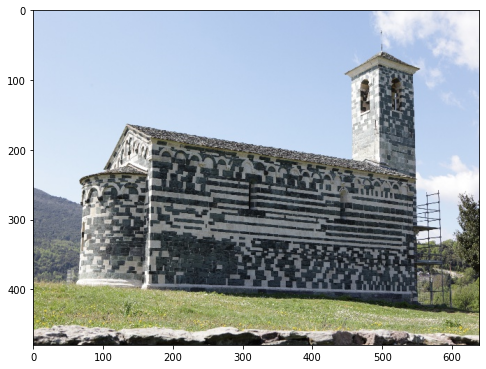

In [5]:
img = cv.imread(ROOT + 'feature/DPP_0010.JPG')

plt.figure(figsize=(8,8))
plt.imshow(img[:,:,::-1])
plt.show()

## Brute-Force Matching

brute-force matcher를 사용해 feature matching을 진행한다.

### feature matching을 진행할 두 이미지 불러오기

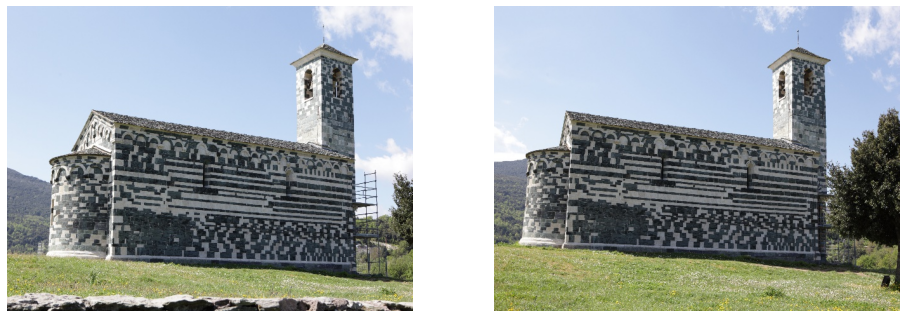

In [6]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(img1[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.imshow(img2[:,:,::-1])
plt.axis('off')
plt.show()

### ORB feature 얻기

지난 과제를 통해 실습한 ORB feature를 구한다.


+

### ORB descriptor 구하기

**과제** 
- 찾은 feature에 대해 descriptor를 구한다.

관련 함수

- `	keypoints, descriptors	=	cv.Feature2D.compute(	image, keypoints[, descriptors]	)`
- `keypoints, descriptors	=	cv.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	)`

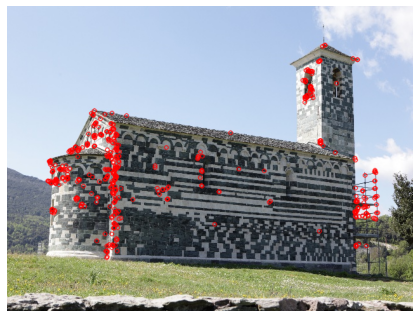

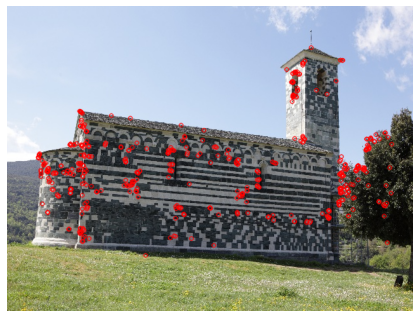

In [7]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

# To-do : 각 이미지에 대해 orb feature를 얻고 시각화하기
orb_kps_img1 = None
orb1 =  cv.ORB_create()
kp1, des1 = orb1.detectAndCompute(img1, None)

orb_kps_img1 = cv.drawKeypoints(img1, kp1, des1, (0, 0, 255), flags=0)

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(orb_kps_img1[:,:,::-1])
plt.axis('off')
plt.show()

#
orb_kps_img2 = None
orb2 =  cv.ORB_create()
kp2, des2 = orb2.detectAndCompute(img2, None)

orb_kps_img2 = cv.drawKeypoints(img2, kp2, des2, (0, 0, 255), flags=0)

plt.figure(figsize=(16,8))
plt.subplot(122)
plt.imshow(orb_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()

### Brute-Force Matching

**과제** 
- feature matching을 진행하고 시각화한다.
- matcher에 cycle consistency를 추가하여 두 이미지를 비교한다.

관련 함수

`	<BFMatcher object>	=	cv.BFMatcher(	[, normType[, crossCheck]]	)
`


In [8]:
from google.colab.patches import cv2_imshow

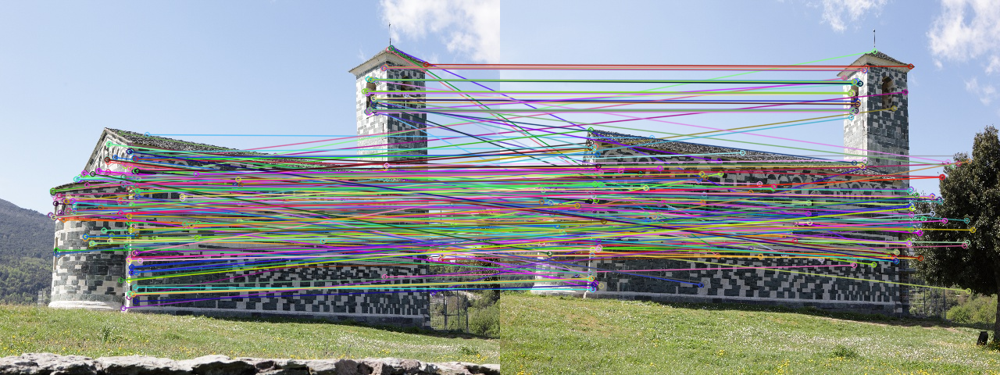

In [9]:
# To-do
matcher = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = matcher.match(des1, des2)
out = cv.drawMatches(img1, kp1, img2, kp2, matches, None, flags=cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(out)
cv.waitKey(0)
cv.destroyAllWindows()

### SIFT feature 얻기

이번 단계에서는 SIFT feature에 대해 매칭을 진행한다.

지난 과제를 통해 실습한 SIFT feature를 구한다.

### SIFT descriptor 구하기

**과제** 
- 찾은 feature에 대해 descriptor를 구한다.

관련 함수

- `	keypoints, descriptors	=	cv.Feature2D.compute(	image, keypoints[, descriptors]	)`
- `keypoints, descriptors	=	cv.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	)`

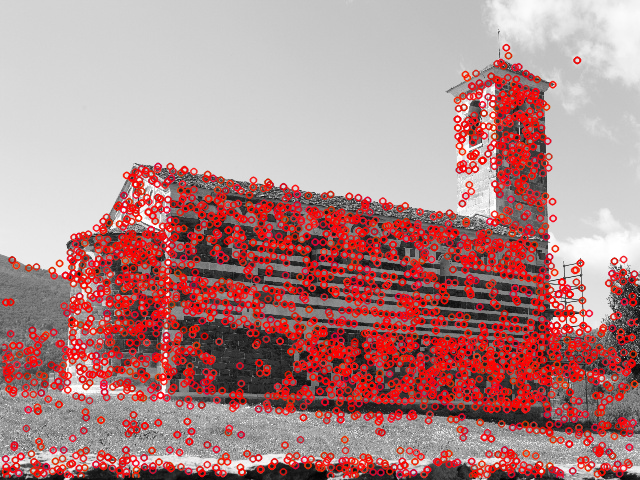

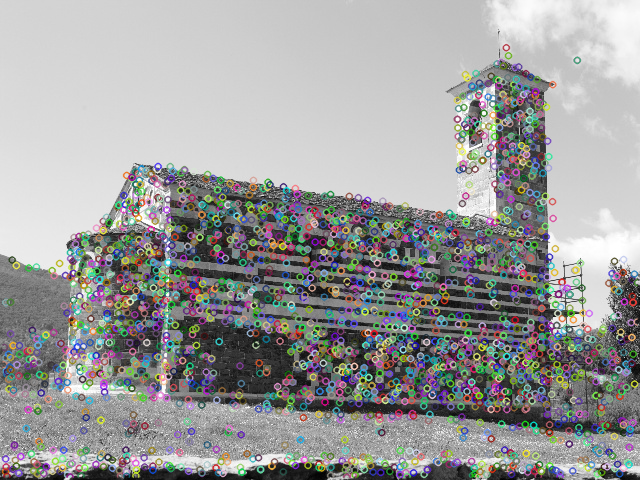

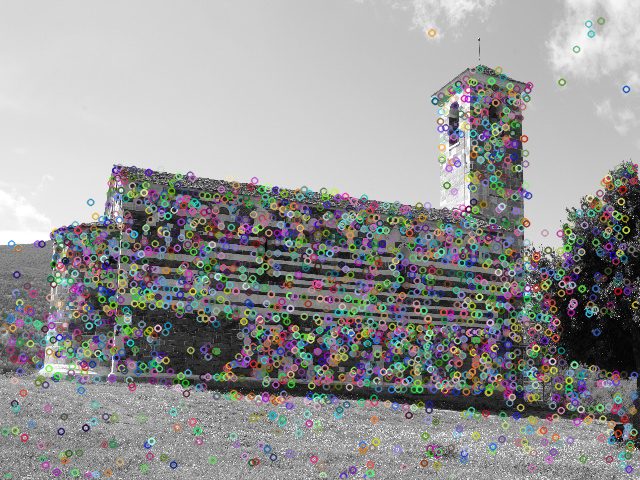

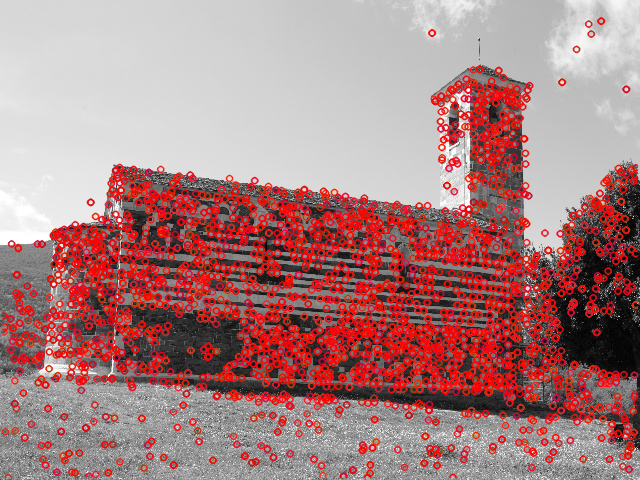

In [10]:
img11 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img22 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

gray11 = cv.cvtColor(img11, cv.COLOR_BGR2GRAY)
gray22 = cv.cvtColor(img22, cv.COLOR_BGR2GRAY)

# To-do

sift11 = cv.xfeatures2d.SIFT_create()
kp11 = sift11.detect(gray1, None)
keypoints11, descriptor11 = sift11.detectAndCompute(gray11, None)
out11 = cv.drawKeypoints(gray11, kp11, img11)
orb_kps_img1 = cv.drawKeypoints(out11, keypoints11, descriptor11, (0, 0, 255), flags=0)
cv2_imshow(orb_kps_img1)
cv.waitKey(0)
cv.destroyAllWindows()
cv2_imshow(out11)
cv.waitKey(0)
cv.destroyAllWindows()

sift22 = cv.xfeatures2d.SIFT_create()
kp22 = sift22.detect(gray22, None)
keypoints22, descriptor22 = sift22.detectAndCompute(gray22, None)
out22 = cv.drawKeypoints(gray22, kp22, img22)
orb_kps_img2 = cv.drawKeypoints(out22, keypoints22, descriptor22, (0, 0, 255), flags=0)
cv2_imshow(out22)
cv.waitKey(0)
cv.destroyAllWindows()
cv2_imshow(orb_kps_img2)
cv.waitKey(0)
cv.destroyAllWindows()

### Brute-Force Matching

**과제** 
- feature matching을 진행하고 시각화한다.
- matcher에 cycle consistency를 추가하여 두 이미지를 비교한다.

관련 함수

`	<BFMatcher object>	=	cv.BFMatcher(	[, normType[, crossCheck]]	)
`


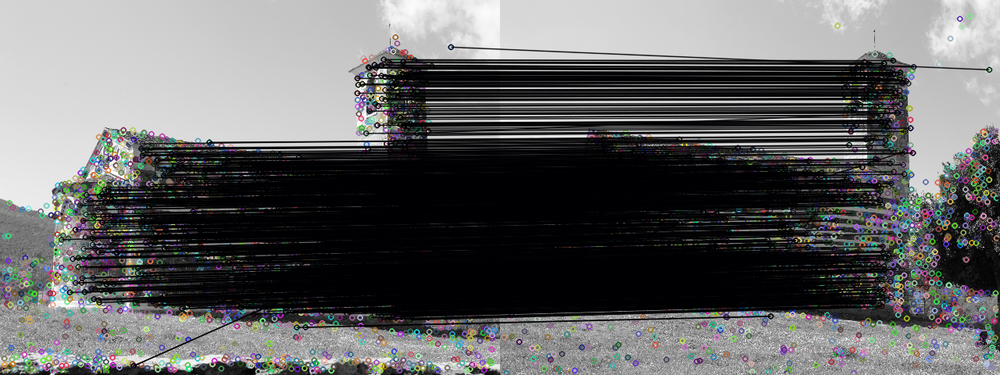

In [11]:
# To-do
bf = cv.BFMatcher(cv.NORM_L1,crossCheck=False)

matches = bf.knnMatch(descriptor11,descriptor22, k=2)
good = []


for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

img3 = cv.drawMatchesKnn(img11,kp11,img22,kp22,good,None,2)

cv2_imshow(img3)
cv.waitKey(0)
cv.destroyAllWindows()

## 다른 이미지에도 적용해보기

위 실습을 바탕으로 주어진 이미지 외에 다른 이미지에도 feature matching을 진행한다. 

- 한 물체를 다른 각도에서 찍은 이미지 2장을 불러온다. (직접 찍은 사진, 인터넷에서 다운로드한 사진 모두 가능)
- 이미지들에 대해 feature matching을 진행한다.
  - feature descriptor는 자유롭게 하나를 선택한다.
  - cycle consistency를 추가한 것과 아닌 것을 비교한다.


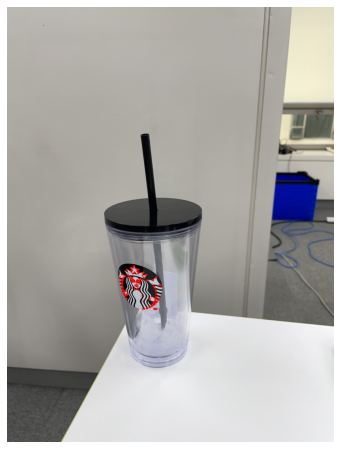

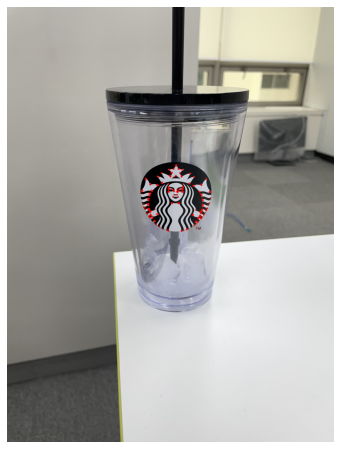

In [17]:
img1 = cv.imread(ROOT + 'feature/lcup1.jpeg')
img2 = cv.imread(ROOT + 'feature/lcup2.jpeg')

gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

# To-do : 각 이미지에 대해 orb feature를 얻고 시각화하기
orb_kps_img1 = None
orb1 =  cv.ORB_create()
kp1, des1 = orb1.detectAndCompute(img1, None)

orb_kps_img1 = cv.drawKeypoints(img1, kp1, des1, (0, 0, 255), flags=0)

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(orb_kps_img1[:,:,::-1])
plt.axis('off')
plt.show()

#
orb_kps_img2 = None
orb2 =  cv.ORB_create()
kp2, des2 = orb2.detectAndCompute(img2, None)

orb_kps_img2 = cv.drawKeypoints(img2, kp2, des2, (0, 0, 255), flags=0)

plt.figure(figsize=(16,8))
plt.subplot(122)
plt.imshow(orb_kps_img2[:,:,::-1])
plt.axis('off')
plt.show()


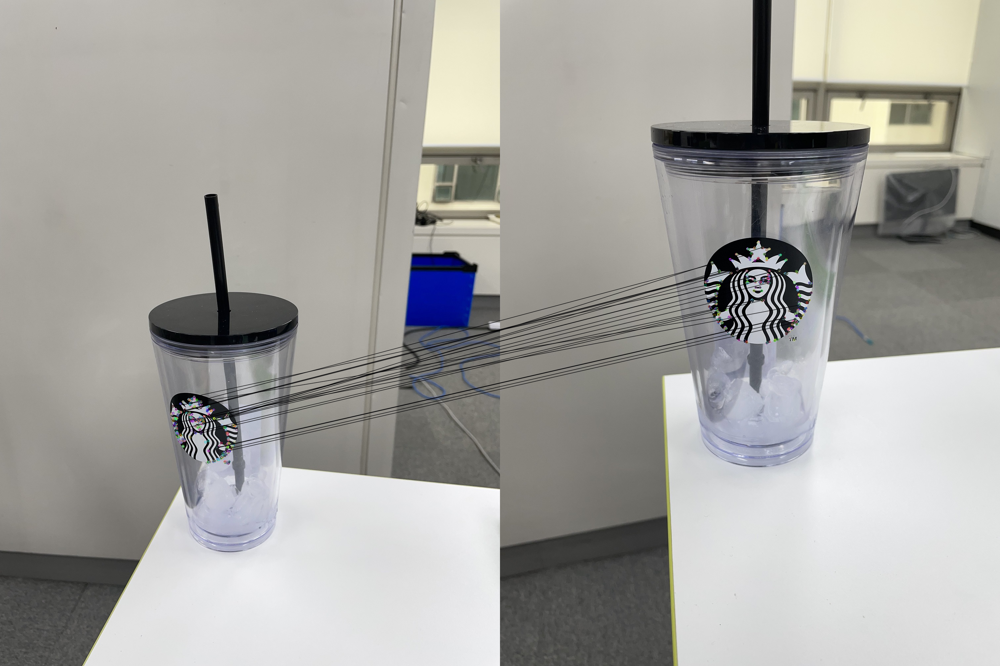

In [18]:
bf = cv.BFMatcher(cv.NORM_L1,crossCheck=False)

matches = bf.knnMatch(des1,des2, k=2)
good = []


for m,n in matches:
   if m.distance < 0.75*n.distance:
       good.append([m])

img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,2)

cv2_imshow(img3)
cv.waitKey(0)
cv.destroyAllWindows()


https://bkshin.tistory.com/entry/OpenCV-28-%ED%8A%B9%EC%A7%95-%EB%A7%A4%EC%B9%ADFeature-Matching

## 추가 점수 과제

- opencv에서는`BFMathcer` 외의 다른 matcher를 제공한다. 이러한 다른 matcher를 이용해 같은 과정을 진행한다.
- 해당 matcher에 대해 간단히 조사해 보고, 각 과정에 대한 설명도 기술한다.

FLANN(Fast Library for Approximate Nearest Neighbors Matching)
  : BF는 전수조사기 때문에 느리다. 따라서 일부 선별적으로 진행하는 방식은 FLANN이 등장하였다.

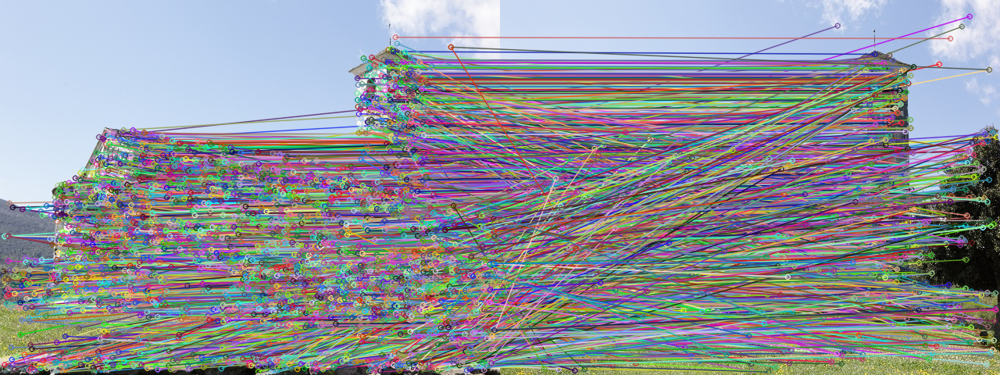

In [16]:
img1 = cv.imread(ROOT + 'feature/DPP_0010.JPG')
img2 = cv.imread(ROOT + 'feature/DPP_0011.JPG')

gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

SIFT33 = cv.xfeatures2d.SIFT_create()

kp33, des33 = SIFT33.detectAndCompute(gray1, None)
kp44, des44 = SIFT33.detectAndCompute(gray2, None)


FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

matcher = cv.FlannBasedMatcher(index_params, search_params)

matches = matcher.match(des33, des44)

res = cv.drawMatches(img1, kp33, img2, kp44, matches, None, \
                flags=cv.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(res)
cv.waitKey(0)
cv.destroyAllWindows()